# 1 Author

**Student Name:** Nivedhaa Ravichandren

**Student ID:** 220256573

# 2 Problem formulation

To predict the area in which the audio is recorded.

# 3 Machine Learning pipeline

We have created a dataset with sounds recoreded from specific locations both indoors and outdoors across London. The objective is to predict where the audio is reorded. From the total recordings, a set of randomly selected 500 samples are taken as the input. 

**INPUT**: Randomly selected 500 samples from audio recorded across London


**OUTPUT**: predict where the audio is recorded

We then extract the needed features from the audio files. Features like Pitch, frequency etc. are used to identify the nature of the recording. This is done using the librosa package. An array containing all these features is created and used to create X and Y which serve as the input for the model to learn. 



# 4 Transformation stage

**Attributes:**
1. File id (Audio file)
2. Area (Place where audio was recorded)
3. Spot (Exact spot of recording)
4. Indoor / Outdoor (Whether the sound was recorded indoor or outdoor)
5. Participant (Unique ID)

This is the basic csv file provided for analysis. We further extract audio files from the the above attributes to help the model predict more precisely. This is because the raw audio files have multiple dimensions which can be very challenging while predicting. 
The ***audio features*** extracted are:

1. **Power** : Intensity of sound. To identify the section of the signal that are significantly louder or quieter.
2. **Pitch - Mean** : Mean of frequency of the sound waves.
3. **Pitch - Standard Deviation** : Standard Deviation of frequency of sound waves.
4. **Fraction of voiced region** : Proportion of signal that contains periodic patterns as opposed to random patterns.
5. **MFCC** : (Mel-frequency cepstral coefficients). represents spectral characteristics of the sound.

**Feature Extraction:**

These are used as the predictors. Additional feature that is extracted is MFCC. MFCC is usually robust to the overall spectrum of the audio signal where the voice of speaker and recording conditions can vary widely.

**Scaling:**

Scaling is bringing the features of the dataset to as single scale by removing the mean and scaling to unit variance. This is done because most of the machine learning models assume that the features are in the same scale and is normally distrbuted. To make the model work more efficiently, we need to scale down the features to the same scale before working on them.

**Oversampling:**

The target variable are is not distributed evenly. So, we can perfrom SMOTE to distribute the samples evenly across the classes. This will avoid the problem of the model being biased towards the majority classes.

**Label Encoding:**

Label Encoding is used on the target column to convert the "area" values into numerical values to use them for multi-class classification problem. This is used to solve the problem that most of the models assume that the values are numerical.

# 5 Modelling

The problem statement depicts a binary class Classification problem. 

The first model used is SVM (Support Vector Machine).

**Why SVM?**

SVM can easily handle high-dimensional data which is essential for our dataset. In this model, the distance between the nearest points of each class and the hyperplane is maximized which prevents overfitting in case of new data. They alse work well with large  number of features.

The second model used is Random Forest.

**Why Random Forest?**

In general, Ensemble models perform better than individual models. Most commonly used Ensemble model is Random Forest which is built based on decision trees as individual models. They can also handle high dimensional data efficiently while taking up less computation time. They are relatively resisatnt to overfitting also.

**Why XGBoost?**

XGBoost is better suited for large scale datasets and real time applications. It is flexible for to different types of data and is good at identifying the most important features for making predictions.'

Based on the performance of each of the model after using hyperparameter tuning and other optimization techniques, we select one model that performs well on all aspects.



# 6 Methodology

Since the target variable is not equally distributed, accuracy cannot be taken as a measure for evaluating the model. There are other measures of accuracy used here : ***Precision, Recall, F1-Score***.


We use Precision, Recall and F1-Score as measures of evaluation here. They can be used to measure how many samples that have been classified under a specific class actually belong to that specific class.

**Precision:** How often the model correctly predicts the target class. Used when False Positives are expensive. Eg. Medical Diagnosis, Fraud Detection

**Recall:** How well the model captures all the instances of the target class. Eg. Disease detection

**F1 Score:** Harmonic mean of precision and recall. Value ranges from 0 to 1 where 1 indicates better performance.

**Confusion Matrix:** 

Confusion Matrix is used to understand how the model has performed overall and is most useful for classification tasks. Rows represent the actual classes of the data and the columns represent the predicted classes. Evaluation metrics like Precision, Recall and F1-Score can be calculated directly using this matrix.

**Classification Report:**

Classification report is useful to compare the performance of the model on different classes and includes the metrics Precision, Recall and F1 Score for each of the target variable.

# 7 Dataset

A small subset of MLEnd London Sounds Dataset - Audio recordings from sounds recorded across London.

**Attributes:**
1. File id (Audio file)
2. Area (Place where audio was recorded)
3. Spot (Exact spot of recording)
4. Indoor / Outdoor (Whether the sound was recorded indoor or outdoor)
5. Participant (Unique ID)


In [ ]:
#Importing Liraries

from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['MLEndLS_2.zip', 'MLEndLS_Sample.zip', 'sample', 'sample_2']

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample_2/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_2.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



In [ ]:
# Loading Data

sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample_2/*.wav'
files = glob.glob(sample_path)
len(files)

500

In [ ]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [ ]:
# Exploring the dataframe

MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [ ]:
MLENDLS_df['area'].value_counts()

campus        823
westend       666
british       404
Euston        234
southbank     229
kensington    144
Name: area, dtype: int64

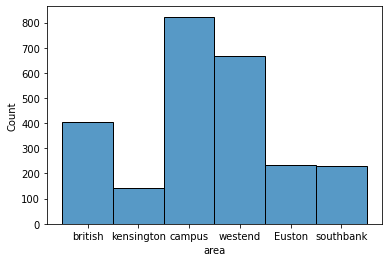

In [ ]:
# Distribution of target feature

sns.histplot(MLENDLS_df['area'])
plt.show()

We can see that the target variable is not evenly distributed. Major portion of data is present under campus and least under kensington.

In [ ]:
for file in files:
  print(file.split('/')[-1])

0605.wav
0604.wav
0606.wav
0608.wav
0607.wav
0610.wav
0609.wav
0612.wav
0611.wav
0613.wav
0614.wav
0615.wav
0616.wav
0617.wav
0619.wav
0618.wav
0620.wav
0621.wav
0622.wav
0623.wav
0624.wav
0625.wav
0626.wav
0627.wav
0629.wav
0628.wav
0630.wav
0632.wav
0631.wav
0633.wav
0634.wav
0635.wav
0636.wav
0637.wav
0639.wav
0638.wav
0643.wav
0640.wav
0641.wav
0642.wav
0644.wav
0645.wav
0646.wav
0647.wav
0649.wav
0648.wav
0651.wav
0650.wav
0652.wav
0653.wav
0655.wav
0654.wav
0656.wav
0657.wav
0660.wav
0659.wav
0658.wav
0663.wav
0661.wav
0662.wav
0664.wav
0666.wav
0665.wav
0667.wav
0668.wav
0669.wav
0671.wav
0670.wav
0673.wav
0672.wav
0674.wav
0677.wav
0675.wav
0676.wav
0678.wav
0681.wav
0680.wav
0679.wav
0683.wav
0682.wav
0684.wav
0685.wav
0687.wav
0686.wav
0688.wav
0689.wav
0690.wav
0691.wav
0692.wav
0693.wav
0694.wav
0696.wav
0695.wav
0697.wav
0698.wav
0699.wav
0700.wav
0701.wav
0702.wav
0703.wav
0704.wav
0705.wav
0707.wav
0708.wav
0706.wav
0709.wav
0710.wav
0711.wav
0712.wav
0713.wav
0714.wav
0

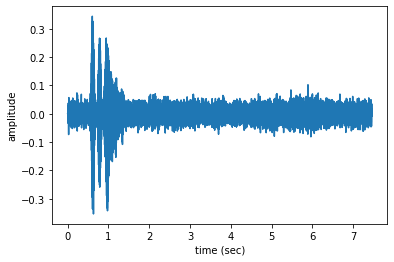

In [ ]:
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [ ]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area            campus
spot            square
in_out         outdoor
Participant         S4
Name: 0605.wav, dtype: object

In [ ]:
# Label Encoding target

from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
MLENDLS_df['area'] = labelencoder.fit_transform(MLENDLS_df['area'])
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,1,street,outdoor,S151
0002.wav,3,dinosaur,indoor,S127
0003.wav,2,square,outdoor,S18
0004.wav,3,hintze,indoor,S179
0005.wav,2,square,outdoor,S176
...,...,...,...,...
2496.wav,5,trafalgar,outdoor,S151
2497.wav,2,square,outdoor,S6
2498.wav,5,national,indoor,S96


In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 328986 samples


In [ ]:
#Extracting features

def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [ ]:
# Splitting X and Y

def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['area']

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)

    mfccs = librosa.feature.mfcc(x, sr=fs)
    mfccs_mean = np.nanmean(mfccs) if np.mean(np.isnan(mfccs))<1 else 0  
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr, mfccs_mean]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [ ]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 500/500 [13:13<00:00,  1.59s/it]


In [ ]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (500, 5)
The shape of y is (500,)
The labels vector is [2 1 5 2 5 4 5 2 2 2 5 3 2 2 2 2 2 0 5 5 0 4 4 2 4 2 3 5 2 2 2 5 5 2 2 2 5
 5 1 2 2 1 5 2 3 5 1 4 5 1 5 1 0 1 2 1 5 1 5 2 2 1 4 2 2 5 5 0 0 4 5 0 0 2
 5 5 4 2 1 2 0 5 0 0 0 2 2 2 3 1 1 5 5 1 1 5 5 2 5 1 2 2 0 0 3 2 2 5 3 2 5
 0 5 2 2 0 2 5 2 4 2 5 2 0 0 5 4 1 1 5 1 2 2 4 5 5 2 2 2 5 2 1 3 2 2 2 2 4
 2 3 2 2 1 2 5 0 5 2 1 2 5 3 0 5 4 2 2 1 5 0 2 2 0 2 4 1 1 0 5 5 2 4 1 2 2
 2 5 0 5 3 5 2 2 1 2 5 4 2 5 2 5 2 2 2 2 1 5 0 2 2 5 2 0 1 5 1 2 3 2 2 1 1
 2 5 5 2 2 4 5 2 4 2 2 5 1 0 1 2 1 4 5 2 2 2 1 5 2 3 3 0 0 2 0 2 2 1 1 2 2
 2 2 2 2 2 2 2 5 2 5 5 1 5 0 1 1 1 2 2 5 5 5 3 3 1 1 2 1 3 1 2 2 5 2 4 1 2
 1 0 5 1 5 5 2 5 1 1 5 5 4 2 1 2 5 5 0 1 2 2 5 5 1 5 4 1 5 4 2 4 5 2 5 5 1
 5 0 5 2 2 0 2 4 1 2 2 2 5 2 4 0 2 4 1 2 0 2 5 2 2 0 2 4 2 2 3 4 2 2 2 5 2
 5 2 0 5 0 1 5 2 5 0 5 1 3 1 2 2 0 2 5 1 5 5 2 4 1 2 5 2 1 4 3 5 2 5 2 5 1
 2 5 0 5 5 2 5 2 2 5 2 1 5 4 2 1 5 2 2 5 0 1 0 0 2 2 2 0 1 2 2 4 3 0 2 2 2
 2 2 2 2 2 5 5 5 1 1 0 5 2 

In [ ]:
X

array([[ 7.91824856e-03,  1.95685684e+02,  5.41499207e+01,
         8.70917574e-02, -4.82084483e-01],
       [ 1.83470721e-02,  2.38655950e+02,  3.27296722e+01,
         8.39580210e-02,  9.22084689e-01],
       [ 1.22546270e-02,  9.07290698e+01,  4.61877986e+00,
         7.81499203e-02, -2.62948364e-01],
       ...,
       [ 9.62948589e-03,  2.32218396e+02,  3.52957554e+01,
         1.17549669e-01, -4.65232706e+00],
       [ 1.62692541e-02,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  2.09038377e+00],
       [ 6.43424902e-03,  2.17119273e+02,  4.32652491e+01,
         9.16370107e-02, -1.51926839e+00]])

# 8 Results

We use three machine learning algorithms here to train the model.

In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((350, 5), (150, 5), (350,), (150,))

In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=0)
X_train, y_train = smote.fit_resample(X_train, y_train)
X_val, y_val = smote.fit_resample(X_val, y_val)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

In [ ]:
# Scaling

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_Xtrain = scaler.fit_transform(X_train)
scaled_Xval = scaler.fit_transform(X_val)
print(scaled_Xtrain)

[[-0.75376461 -0.09636631 -0.1815191  -0.1664653  -0.70426159]
 [-0.66735992 -0.34037672 -0.3099156   0.38161336 -0.40871027]
 [-0.74797077  1.09226165 -0.09555219 -0.4910234   0.37183185]
 ...
 [-0.76701997  0.60426129 -0.38530976  0.34935407 -1.47133182]
 [ 0.93742739 -1.92424294 -0.94760745 -1.12061032  1.35660443]
 [-0.86598961 -0.08421859  1.19304914 -0.57765964 -0.38049859]]


In [ ]:
# SVM without scaling

model  = svm.SVC(C=1, gamma = 2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9514285714285714
Validation  Accuracy 0.38666666666666666
The support vectors are (349, 5)


In [ ]:
# SVM with scaling

model  = svm.SVC(C=1,gamma=2)
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.66
Validation  Accuracy 0.38666666666666666
The support vectors are (348, 5)


In [ ]:
# Hyperparameter Tuning For SVM

from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(model, param_grid, refit = True, verbose = 3)
grid.fit(scaled_Xtrain, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.357 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.357 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(C=1, gamma=2),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
SVC(C=10, gamma=0.001)


In [ ]:
c_val = grid.best_estimator_.C
gamma_val = grid.best_estimator_.gamma
c_val, gamma_val

(10, 0.001)

In [ ]:
# Building SVM model with best parameters

model  = svm.SVC(C=c_val, gamma = gamma_val, kernel = 'rbf')
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(scaled_Xval)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.37714285714285717
Validation  Accuracy 0.4066666666666667
The support vectors are (344, 5)


**RANDOM FOREST**

In [ ]:
# Random Forest Classifier without hyperparameter tuning

from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(scaled_Xtrain,y_train)

ytrain_p = rfc.predict(scaled_Xtrain)
yval_p=rfc.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.37714285714285717
Validation  Accuracy 0.30666666666666664
The support vectors are (344, 5)


In [ ]:
# Hyperparameter Tuning for Random Forest

param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [ ]:
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(scaled_Xtrain, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 500]})

In [ ]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 200}

In [ ]:
criterion_val = CV_rfc.best_estimator_.criterion
max_depth_val = CV_rfc.best_estimator_.max_depth
max_features_val = CV_rfc.best_estimator_.max_features
n_estimators_val = CV_rfc.best_estimator_.n_estimators

In [ ]:
# Random Forest with best estimators

clf=RandomForestClassifier(criterion= criterion_val, max_depth= max_depth_val, max_features= max_features_val, n_estimators= n_estimators_val)
clf.fit(scaled_Xtrain,y_train)

ytrain_p = clf.predict(scaled_Xtrain)
yval_p=clf.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.37714285714285717
Validation  Accuracy 0.4266666666666667


**XGBOOST**

In [ ]:
# XGBoost without hyperparameter tuning

from xgboost import XGBClassifier
model = XGBClassifier()
model.fit(scaled_Xtrain, y_train)
print(model)

XGBClassifier(objective='multi:softprob')


In [ ]:
ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.8714285714285714
Validation  Accuracy 0.4266666666666667


In [ ]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [ ]:
grid_search = GridSearchCV(
    estimator=model,
    param_grid=params,
    scoring = 'roc_auc',
    n_jobs = 10,
    cv = 10,
    verbose=True
)
grid_search.fit(scaled_Xtrain, y_train)

In [ ]:
grid_search.best_estimator_

XGBClassifier(colsample_bytree=0.6, gamma=0.5, objective='multi:softprob',
              subsample=0.6)

In [ ]:
col_val = grid_search.best_estimator_.colsample_bytree
gamma_val = grid_search.best_estimator_.gamma
max_depth_value = grid_search.best_estimator_.max_depth
subsample_val = grid_search.best_estimator_.subsample

In [ ]:
# XGBoost with the best parameters

model = XGBClassifier(colsample_bytree=col_val, gamma=gamma_val, max_depth=max_depth_value, subsample=subsample_val)
model.fit(scaled_Xtrain, y_train)
ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.82
Validation  Accuracy 0.4266666666666667


In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
confusion_matrix(y_val, yval_p)

array([[ 0,  0, 15,  0,  0,  1],
       [ 0,  1, 20,  0,  0,  3],
       [ 0,  0, 55,  0,  0,  3],
       [ 0,  0,  8,  0,  0,  0],
       [ 0,  0, 11,  0,  0,  0],
       [ 0,  0, 25,  0,  0,  8]])

In [ ]:
# Classification Report Training
from sklearn.metrics import classification_report
print(classification_report(y_val, yval_p))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        16
           1       1.00      0.04      0.08        24
           2       0.41      0.95      0.57        58
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00        11
           5       0.53      0.24      0.33        33

    accuracy                           0.43       150
   macro avg       0.32      0.21      0.16       150
weighted avg       0.44      0.43      0.31       150



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Classification Report Validation
from sklearn.metrics import classification_report
print(classification_report(y_train, ytrain_p))

              precision    recall  f1-score   support

           0       1.00      0.69      0.82        36
           1       0.93      0.75      0.83        52
           2       0.71      0.96      0.82       125
           3       1.00      0.53      0.70        15
           4       0.94      0.62      0.74        26
           5       0.88      0.82      0.85        96

    accuracy                           0.82       350
   macro avg       0.91      0.73      0.79       350
weighted avg       0.85      0.82      0.82       350



# 9 Conclusions

We have used three different models to train the data. Out of the three, XGBoost seem to perform well.

**Conclusion:**

The average training accuracy across models is 82% which is acceptable for practical data. The average validation accuracy is 43%. Since the target variable is not evenly distributed, accuracy cannot be taken as the evaluation metric. The evaluation metrics Precision, Recall and F1-Score also yield decent results as shown in the classification report. 

**Improvements:**

A sample of 500 audio files is taken as input. 
1. One scope of improvement can be adding more samples for analysis which will help the model learn better. 
2. Adding more features or doing feature engineering on the existing features can help improve the performance of the model.